## Installation Pacakge

In [ ]:
%%capture
!pip install viser

import torch
import torch.nn as nn
import math
from torch.utils.data import Dataset, DataLoader
import numpy as np
import skimage as sk
import skimage.io as skio
from matplotlib import pyplot as plt
import torch.optim as optim
import cv2
import random



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/MyDrive/project5

/content/drive/.shortcut-targets-by-id/1APhA-_jBAkN_ptbdCyRPHmOMq5cDOR9a/project5


In [ ]:
%%capture
!pip install wandb

In [ ]:
import wandb
wandb.login()
# key = 976a89d0166c578b2ff9264c77dbe74bdc1914b5

wandb: Currently logged in as: jding25 (claireding). Use `wandb login --relogin` to force relogin


True

# Part 1: Fit a Neural Field to a 2D Image

## Multilayer Perceptron (MLP)

In [ ]:
class SimpleMlp(nn.Module):
  def __init__(self, L = 10, input_dim = 2, hidden_dim = 256):
    super().__init__()
    self.L = L
    # self.pe = PositionEncoding(hidden_dim)
    self.mlp = nn.Sequential(
        nn.Linear(input_dim + L * 2 * input_dim, hidden_dim),
        nn.ReLU(),
        nn.Linear(hidden_dim, hidden_dim),
        nn.ReLU(),
        nn.Linear(hidden_dim, hidden_dim),
        nn.ReLU(),
        nn.Linear(hidden_dim, 3),
        nn.Sigmoid()
    )

  def positional_encoding(self,x, L):
    # Initialize the positional encoding vector
    pe = [x]

    # Apply sinusoidal functions
    for i in range(L):
        pe.append(torch.sin(2 **(i) * math.pi * x))
        pe.append(torch.cos(2 **(i) * math.pi * x))

    # Concatenate all components to form the final positional encoding
    pe = torch.cat(pe, dim=-1)

    return pe

  def forward(self,uv):
    uv = self.positional_encoding(uv, self.L)
    output = self.mlp(uv)
    return output




## DataLoader

In [ ]:
class CustomDataset(Dataset):
  def __init__(self, img_dir, n):
    self.image_path = img_dir
    self.n = n


    self.image = skio.imread(img_dir)
    self.image = sk.img_as_float(self.image)
    self.img_size = self.image.shape[:2]

    self.height, self.width, _ = self.image.shape
    print(self.height, self.width, self.img_size)

  def __len__(self):
    return self.n

  # randomly sample N pixels from the image
  def __getitem__(self, index):
    coordinates = np.random.rand(self.n, 2) ## coordinates in 0-1 range

    coordinates[:, 0] *= self.height
    coordinates[:, 1] *= self.width

    coordinates = coordinates.astype(int)

    # Get pixel colors using skimage
    colors = np.array([self.image[int(x), int(y)] for x, y in coordinates])

    # convert coordinates back to range 0,1
    coordinates = coordinates / np.array(self.img_size)

    # Convert to PyTorch tensors
    coordinates = torch.tensor(coordinates, dtype=torch.float32)
    colors = torch.tensor(colors, dtype=torch.float32)

    return coordinates, colors

## Loss Function, Optimizer, and Metric

In [ ]:


wandb.init(
    project="fox",
    entity = "jding25")


wandb: Currently logged in as: jding25 (claireding). Use `wandb login --relogin` to force relogin


In [ ]:
img_dir = "fox.jpg"
N = 10000
dataset = CustomDataset(img_dir, N)
dataloader = DataLoader(dataset,batch_size = 10000)

model = SimpleMlp().cuda()
criterion = nn.MSELoss()
lr = 1e-2
# lr = 0.5
optimizer = optim.Adam(model.parameters(), lr=lr)
num_epohs = 1000

psnr = 0.0

for epoch in range(num_epohs):
  for inputs, targets in dataloader:
    inputs = inputs.cuda()
    targets = targets.cuda()

    optimizer.zero_grad()

    outputs = model(inputs)

    loss = criterion(outputs, targets)

    loss.backward()

    optimizer.step()

    # Calculate PSNR
    mse = loss.item()
    psnr = 10 * math.log10(1 / mse)
    # wandb.log({"psnr": psnr, "loss": loss, "epoch":epoch})
    print(f'Iteration [{epoch}], Loss: {mse}')
    # Print the PSNR for every 100 iterations
    if (epoch + 1) % 100 == 0:
        print(f'Iteration [{epoch + 1}/{num_epohs}], PSNR: {psnr:.2f}')

# Final PSNR after training
print(f'Final PSNR: {psnr:.2f}')


689 1024 (689, 1024)
Iteration [0], Loss: 0.10103856027126312
Iteration [0], Loss: 0.14993394911289215
Iteration [0], Loss: 0.08340617269277573
Iteration [0], Loss: 0.09183710813522339
Iteration [0], Loss: 0.09322483092546463
Iteration [0], Loss: 0.08805869519710541
Iteration [0], Loss: 0.08131557703018188
Iteration [0], Loss: 0.0734352245926857
Iteration [0], Loss: 0.067628875374794
Iteration [0], Loss: 0.0659571960568428
Iteration [0], Loss: 0.0645919069647789
Iteration [0], Loss: 0.06077998876571655
Iteration [0], Loss: 0.05410502105951309
Iteration [0], Loss: 0.054071106016635895
Iteration [0], Loss: 0.05303408205509186
Iteration [0], Loss: 0.05123531073331833
Iteration [0], Loss: 0.05050177499651909
Iteration [0], Loss: 0.04851763695478439
Iteration [0], Loss: 0.047456495463848114
Iteration [0], Loss: 0.04612758383154869
Iteration [0], Loss: 0.0474603995680809
Iteration [0], Loss: 0.04503100737929344
Iteration [0], Loss: 0.043414197862148285
Iteration [0], Loss: 0.0423412024974823

KeyboardInterrupt: ignored

In [ ]:
wandb.finish()

epoch,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█
loss,▅▆▃▄▄▆▅▄█▂▇▅▄▇▆▁▅▇▂▃▇▄▆▅▆▃▆▅▄▄▅▇▄▄▅▂▅▆▇▅
psnr,▄▃▆▅▅▃▄▅▁▇▂▄▅▂▃█▄▂▇▆▂▅▃▄▃▆▃▄▅▅▄▂▅▅▄▇▄▃▂▄
epoch,1
loss,0.22068
psnr,6.56242


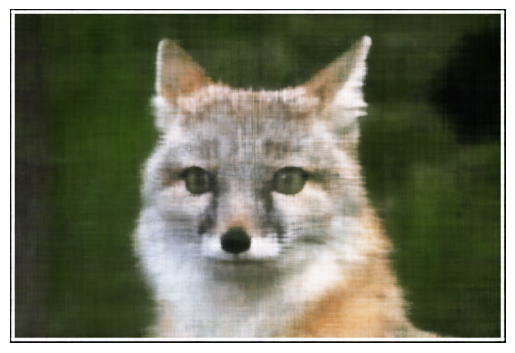

In [ ]:
model.eval()  # Set the model to evaluation mode
model.cpu()
# Generate 2D coordinates (e.g., create a regular grid)

x, y = np.meshgrid(np.linspace(0, 1, dataset.image.shape[1]), np.linspace(0, 1, dataset.image.shape[0]))
coordinates = np.stack((y, x), axis=-1)
coordinates = torch.tensor(coordinates, dtype=torch.float32).view(-1, 2)

# Pass coordinates through the model to generate pixel colors
with torch.no_grad():
    predicted_colors = model(coordinates)

# Convert predicted colors to a NumPy array
predicted_colors = predicted_colors.numpy()

# Reshape the predicted colors to match the image dimensions
generated_image = predicted_colors.reshape(dataset.image.shape)

# Visualize the generated image
plt.imshow(generated_image)
plt.axis('off')
plt.show()

# Part 2: NeRF

In [ ]:
data = np.load(f"lego_200x200.npz")

# Training images: [100, 200, 200, 3]
images_train = data["images_train"] / 255.0

# Cameras for the training images
# (camera-to-world transformation matrix): [100, 4, 4]
c2ws_train = data["c2ws_train"]

# Validation images:
images_val = data["images_val"] / 255.0

# Cameras for the validation images: [10, 4, 4]
# (camera-to-world transformation matrix): [10, 200, 200, 3]
c2ws_val = data["c2ws_val"]

# Test cameras for novel-view video rendering:
# (camera-to-world transformation matrix): [60, 4, 4]
c2ws_test = data["c2ws_test"]

# Camera focal length
focal = data["focal"]  # float

In [ ]:
import numpy as np

'''
Camera to World Coordinate Conversion
=======================================
transform(c2w, x_c) that transform a point from camera to the world space
=======================================
Xw = (xw, yw, zw); Xc = (xc, yc, zc)
 R: 3x3 t: 3x1
w2c = |R  t|
      |0  1| --> 4x4
inverse of it is c2w
'''

#input xc = 3 x n, output: xw = 3 x n
def transform(c2w, xc):
  xc = np.array(xc) # ensure it's in array form

  # xc = array([xc, yc, zc, 1]) --> 4 x n
  xc = np.vstack((xc, np.ones(xc.shape[1])))

  # Apply the transformation matrix
  xw = np.dot(c2w, xc)

  # Divide by the last row to perform the homogeneous transformation -> nx4
  xw = xw / xw[-1, :]

  # Return the resulting world coordinates
  return xw[:3,:]




In [ ]:
'''
Pixel to Camera Coordinate Conversion
=====================================
transform a point from the pixel coordinate system back to the camera coordinate system: x_c = pixel_to_camera(K, uv, s)
=====================================

focal_length = (f_x, f_y)
principal points = o_x = image_width/2; o_y = image_heigt / 2
intrinsic matrix K = |fx 0  ox|
                     |0  fy oy|
                     |0. 0. 1 |
s*[ u, v, 1].T = K*[x_c, y_c, z_c].T;  s = z_c
'''
import numpy as np


def pixel_to_camera(K, uv, s):
    # uv: 2 x N
    uv = np.array(uv)
    uv = np.vstack((uv, np.ones(uv.shape[1])))

    # Check if s is scalar, if so, make it an array with the same shape as uv
    if np.isscalar(s):
        s = np.full(uv.shape[1], s)

    # Invert the transformation
    uvw = np.dot(np.linalg.inv(K), uv)
    xc = uvw * s

    return xc


In [ ]:
'''
Pixel to Ray
============================
convert a pixel coordinate to a ray with origin and noramlized direction: ray_o, ray_d = pixel_to_ray(K, c2w, uv)
============================
origin of ray ro
direction of ray rd = (Xw - ro)/||Xw-ro||_22
convert a pixel coordinate to a ray with origin and noramlized direction: ray_o, ray_d = pixel_to_ray(K, c2w, uv)
'''

def pixel_to_ray(K, c2w, uv):
    # uv, 2 x n
    uv = np.array(uv)
    s = 1.0

    xc = pixel_to_camera(K, uv, s)
    xw = transform(c2w, xc)

    w2c = np.linalg.inv(c2w)
    R = w2c[:3,:3]
    t = w2c[:3,3][:,np.newaxis]
    ray_o = - np.linalg.inv(R).dot(t)

    repeated_ray_o = np.tile(ray_o, (1, xw.shape[1]))

    ray_d = (xw - repeated_ray_o)/(np.linalg.norm(xw - repeated_ray_o, axis = 0))

    assert ray_d.shape[0] == 3
    assert ray_d.shape[1] == uv.shape[1]

    return repeated_ray_o, ray_d



## Part 2.2

In [ ]:
## Sampling Rays from Images
#K = intrinsics
#
'''
[Impl: Sampling Rays from Images] In Part 1, we have done random sampling on a single image to get the pixel color and pixel coordinates.
Here we can build on top of that, and with the camera intrinsics & extrinsics, we would be able to convert the pixel coordinates into ray origins and directions. Make sure to account for the offset from image coordinate to pixel center (this can be done simply by adding .5 to your UV pixel coordinate grid)! Since we have multiple images now, we have two options of sampling rays. Say we want to sample N rays at every training iteration, option 1 is to first sample M images, and then sample N // M rays from every image. The other option is to flatten all pixels from all images and do a global sampling once to get N rays from all images. You can choose which ever way do ray sampling.
'''

# implementing option 1: choose M images, sample N//M rays from each image

def sample_rays_from_images_with_uv(image_dataset, N, K, c2w, M = 10):
    # image_dataset is a list of images
    # M is the number of images to sample
    # N is the total number of rays to sample
    # intrinsics is the camera intrinsic matrix
    # extrinsics is a list of camera extrinsic matrices for each image
    # image_width and image_height are the dimensions of the images

    # Step 1: Randomly select M images
    selected_indicies = random.sample(range(len(image_dataset)), M)

    # Step 2: Sample N // M rays from each selected image
    rays_per_image = N // M
    u = []
    v = []
    sampled_colors = []
    for index in selected_indicies:
      image = image_dataset[index]
      height, width, _ = image.shape

      for _ in range(rays_per_image):
        u_rand = random.uniform(0, width)
        v_rand = random.uniform(0, height)
        u_normalized = u_rand + 0.5
        v_normalized = v_rand + 0.5

        u.append(u_normalized)
        v.append(v_normalized)
        pixel_color = image[int(v_rand),int(u_rand)]
        sampled_colors.append(pixel_color)

    uv = np.stack((u,v))

    # print("this is uv shape from sample_ray_from_image, should be 2 x n", uv.shape)
    ray_o, ray_d = pixel_to_ray(K, c2w, uv)

    return ray_o, ray_d, uv, sampled_colors

def sample_rays_from_images(image_dataset, N, K, c2w):
    ray_o, ray_d, _, _ = sample_rays_from_images_with_uv(image_dataset, N, K, c2w)

    return ray_o, ray_d



[Impl: Sampling Points along Rays.] After having rays, we also need to discritize each ray into samples that live in the 3D space. The simplist way is to uniformly create some samples along the ray (t = np.linspace(near, far, n_samples)). For the lego scene that we have, we can set near=2.0 and far=6.0. The actually 3D corrdinates can be accquired by
x
=
R
o
+
R
d
∗
t
. However this would lead to a fixed set of 3D points, which could potentially lead to overfitting when we train the NeRF later on. On top of this, we want to introduce some small perturbation to the points only during training, so that every location along the ray would be touched upon during training. this can be achieved by something like t = t + np.random((far - near) / n_samples). We recommend to set n_samples to 32 or 64 in this project.

In [ ]:
'''
Sampling Points along Rays.
===========================
'''

def sample_along_rays(ray_o, ray_d, perturb, n_samples = 64, near = 2.0, far = 6.0):
  t = np.linspace(near, far, n_samples)
  # perturbation
  if perturb:
    perturbations = np.random.uniform(0, (far - near) / n_samples, n_samples)
    t += perturbations
  t = t[:, np.newaxis]
  ray_o_expanded = np.expand_dims(ray_o, axis=2)
  ray_d_expanded = np.expand_dims(ray_d, axis=2)

  coordinates = ray_o_expanded + ray_d_expanded * t.T
  coordinates = np.einsum('ijk->jki', coordinates)

  return coordinates



## Part 2.3

In [ ]:
 import torch
from torch.utils.data import Dataset, DataLoader

class RaysData(Dataset):

  def __init__(self, images, K, c2ws_train):
    self.images = images
    self.K = K
    self.c2ws_train = c2ws_train
    self.image_shape = images[0].shape

  def __len__(self):
    return len(self.images)

  def sample_rays(self, n, M = 10):
    selected_indicies = random.sample(range(len(self.images)), M)
    rays_per_image = n // M
    ray_os = []
    ray_ds = []
    pixel_colors = []
    # 1. randomly sample pixels from multiview images.

    coordinates = np.random.rand(rays_per_image, 2) ## coordinates in 0-1 range

    coordinates[:, 0] *= self.image_shape[0]
    coordinates[:, 1] *= self.image_shape[1]

    coordinates = coordinates.astype(int)

    v = coordinates[:, 0] + 0.5
    u = coordinates[:, 1] + 0.5
    uv = np.stack((u, v))

    for index in selected_indicies:
      image = self.images[index]
      c2w = self.c2ws_train[index]

      ray_o, ray_d = pixel_to_ray(self.K, c2w, uv)

      ray_os.append(ray_o)
      ray_ds.append(ray_d)
      colors = image[coordinates[:, 0], coordinates[:, 1]]

      pixel_colors.append(colors)

    ray_os = np.concatenate(ray_os, axis=1)
    ray_ds = np.concatenate(ray_ds, axis=1)

    return np.array(ray_os), np.array(ray_ds), np.array(pixel_colors)





In [ ]:
import viser, time
import numpy as np

# --- You Need to Implement These ------
K = np.array([[focal, 0, 100],
              [0, focal, 100],
              [0, 0, 1]])
dataset = RaysData(images_train, K, c2ws_train)
rays_o, rays_d, pixels = dataset.sample_rays(100)


# print(rays_o.shape, rays_d.shape)
points = sample_along_rays(rays_o, rays_d, perturb=True)
points = points.T
rays_o = rays_o.T
rays_d = rays_d.T

H, W = images_train.shape[1:3]
# ---------------------------------------

server = viser.ViserServer(share=True)
for i, (image, c2w) in enumerate(zip(images_train, c2ws_train)):
    server.add_camera_frustum(
        f"/cameras/{i}",
        fov=2 * np.arctan2(H / 2, K[0, 0]),
        aspect=W / H,
        scale=0.15,
        wxyz=viser.transforms.SO3.from_matrix(c2w[:3, :3]).wxyz,
        position=c2w[:3, 3],
        image=image
    )
for i, (o, d) in enumerate(zip(rays_o, rays_d)):
    server.add_spline_catmull_rom(
        f"/rays/{i}", positions=np.stack((o, o + d * 6.0)),
    )
server.add_point_cloud(
    f"/samples",
    colors=np.zeros_like(points).reshape(-1, 3),
    points=points.reshape(-1, 3),
    point_size=0.02,
)
time.sleep(1000)

(viser) Share URL requested! (expires in 24 hours)

╭───────────────────────── viser ──────────────────────────╮
│             ╷                                            │
│   HTTP      │ http://0.0.0.0:8084                        │
│   Websocket │ ws://0.0.0.0:8084                          │
│   Share URL │ https://aligned-glyph.share.viser.studio   │
│             ╵                                            │
╰──────────────────────────────────────────────────────────╯

(viser) Connection opened (0, 1 total), 405 persistent messages

(viser) Connection closed (0, 0 total)

KeyboardInterrupt: ignored

## Part 2.4

In [ ]:
'''
Part 2.4: Neural Radiance Field
[Impl: Network] After having samples in 3D, we want to use the network to predict the density and color for those samples in 3D.
So you would create a MLP that is similar to Part 1, but with three changes:
Input is now 3D world coordinates instead of 2D pixel coordinates, along side a 3D vector as the ray direction.
And we are going to output not only the color, but also the density for the 3D points.
In the radiance field, the color of each point depends on the view direction,
so we are going to use the view direction as the condition when we predict colors.

Note we use Sigmoid to constrain the output color within range (0, 1), and use ReLU to constrain the output density to be positive.

The ray direction also needs to be encoded by positional encoding (PE) but can use less frequency (e.g., L=4) than the cooridnate PE (e.g., L=10).
Make the MLP deeper. We are now doing a more challenging task of optimizing a 3D representation instead of 2D. So we need a more powerful network.
Inject the input (after PE) to the middle of your MLP through concatenation.
It's a general trick for deep neural network, that is helpful for it to not forgetting about the input.
Below is a structure of the network that you can start with:'''


In [ ]:
## input: 3d world coordinates
##        ray direction
##output: color
##        density


class RadianceFieldNetwork(nn.Module):
  def __init__(self, coordinated_L = 10, ray_d_L = 4, dim = 3, hidden_dim = 256):
    super().__init__()
    self.coordinated_L = coordinated_L
    self.ray_d_L = ray_d_L

    self.first_linear_path = nn.Sequential(
        nn.Linear(dim + coordinated_L * 2 * dim, hidden_dim),
        nn.ReLU(),
        nn.Linear(hidden_dim, hidden_dim),
        nn.ReLU(),
        nn.Linear(hidden_dim, hidden_dim),
        nn.ReLU(),
        nn.Linear(hidden_dim, hidden_dim),
        nn.ReLU(),
    )
    self.second_linear_path_density = nn.Sequential(
        nn.Linear(dim + coordinated_L * 2 * dim + 256, hidden_dim),
        nn.ReLU(),
        nn.Linear(hidden_dim, hidden_dim),
        nn.ReLU(),
        nn.Linear(hidden_dim, hidden_dim),
        nn.ReLU(),
        nn.Linear(hidden_dim, hidden_dim)
    )
    self.second_linear_path_rgb = nn.Sequential(
        nn.Linear(dim + coordinated_L * 2 * dim + 256, hidden_dim),
        nn.ReLU(),
        nn.Linear(hidden_dim, hidden_dim),
        nn.ReLU(),
        nn.Linear(hidden_dim, hidden_dim),
        nn.ReLU(),
        nn.Linear(hidden_dim, hidden_dim),
        nn.Linear(hidden_dim, hidden_dim)
    )
    self.density_output = nn.Sequential(
        nn.Linear(hidden_dim, 1),
        nn.ReLU()
    )
    self.rgb_output = nn.Sequential(
        nn.Linear(dim + ray_d_L * 2 * dim + 256, 128), # the first one is not hidden_dim
        nn.ReLU(),
        nn.Linear(128, 3),
        nn.Sigmoid()
    )

  def positional_encoding(self, x, L):
    # Initialize the positional encoding vector
    pe = [x]

    # Apply sinusoidal functions
    for i in range(L):
        pe.append(torch.sin(2 **(i) * math.pi * x))
        pe.append(torch.cos(2 **(i) * math.pi * x))

    # Concatenate all components to form the final positional encoding
    pe = torch.cat(pe, dim=-1)

    return pe




  # coordinates is 3x1 world coordinates
  # ray_d is 3x1 ray_direction
  def forward(self, coordinates, ray_d):
    encoded_coordinates = self.positional_encoding(coordinates, 10)
    encoded_ray_d = self.positional_encoding(ray_d, 4)

    first_path_coordinates = self.first_linear_path(encoded_coordinates)
    concatenated_first_path = torch.cat([first_path_coordinates, encoded_coordinates], dim = 2)
    pre_density = self.second_linear_path_density(concatenated_first_path)
    density = self.density_output(pre_density)

    pre_rgb = self.second_linear_path_rgb(concatenated_first_path)
    concatednated_pre_rgb = torch.cat([pre_rgb, encoded_ray_d], dim = 2)

    rgb = self.rgb_output(concatednated_pre_rgb)

    return density, rgb







## Part 2.5: Volume Rendering

In [ ]:
# assume colors are num_rays x N x 3 and densities are num_rays x N x 2
def volrend(densities, colors, step_size = (6.0 - 2.0) / 64):
  N = colors.shape[1]
  Ti = torch.exp(- torch.cumsum(densities * step_size, dim = 1) + densities * step_size)
  C_hat = torch.sum(Ti * (1 - torch.exp(-densities * step_size)) * colors, dim = 1)
  return C_hat

## Putting Everything Together

In [ ]:
### TRYING HERE!!!!

'''
Sampling Points along Rays.
===========================
'''


import torch
from torch.utils.data import Dataset, DataLoader

class RaysData(Dataset):

  def __init__(self, images, K, c2ws_train):
    self.images = images
    self.K = K
    self.c2ws_train = c2ws_train
    self.image_shape = images[0].shape

  def __len__(self):
    return len(self.images)


  def sample_rays(self, n, M = 100):
    selected_indicies = random.sample(range(len(self.images)), M)
    rays_per_image = n // M
    ray_os = []
    ray_ds = []
    pixel_colors = []
    # 1. randomly sample pixels from multiview images.

    coordinates = np.random.rand(rays_per_image, 2) ## coordinates in 0-1 range

    coordinates[:, 0] *= self.image_shape[0]
    coordinates[:, 1] *= self.image_shape[1]

    coordinates = coordinates.astype(int)

    v = coordinates[:, 0] + 0.5
    u = coordinates[:, 1] + 0.5
    uv = np.stack((u, v))

    for index in selected_indicies:
      image = self.images[index]
      c2w = self.c2ws_train[index]

      ray_o, ray_d = pixel_to_ray(self.K, c2w, uv)

      ray_os.append(ray_o)
      ray_ds.append(ray_d)
      colors = image[coordinates[:, 0], coordinates[:, 1]]

      pixel_colors.append(colors)

    ray_os = np.concatenate(ray_os, axis=1)
    ray_ds = np.concatenate(ray_ds, axis=1)

    return np.array(ray_os), np.array(ray_ds), np.array(pixel_colors)



In [ ]:
wandb.init(
    project="lego_truck",
    entity = "jding25")

wandb: Currently logged in as: jding25. Use `wandb login --relogin` to force relogin


In [ ]:
# model = RadianceFieldNetwork()

# checkpoint = torch.load('/content/drive/My Drive/project5/nerf1_checkpoint.pth')
# model.load_state_dict(checkpoint['model_state_dict'])

def eval_model(epoch):
  model.eval()  # Set the model to evaluation mode
  model.cpu()
  dataset = RaysData(images_val, K, c2ws_val)

  result_image = np.zeros((200,200,3))
  # Pass coordinates through the model to generate pixel colors
  with torch.no_grad():

    rays_per_image = 40000

    x = np.arange(200)
    y = np.arange(200)

    x_coords, y_coords = np.meshgrid(x, y)
    coordinates = np.vstack((x_coords.flatten(), y_coords.flatten())).T

    v = coordinates[:, 0] + 0.5
    u = coordinates[:, 1] + 0.5
    uv = np.stack((u, v))

    for i in range(10):
      image = dataset.images[i]
      c2w =dataset.c2ws_train[i]

      ray_o, ray_d = pixel_to_ray(K, c2w, uv)
      ray_o, ray_d = ray_o.T, ray_d.T
      colors = np.array([image[int(y), int(x)] for x, y in coordinates])
      points = sample_along_rays(ray_o, ray_d, perturb=False)
      points = np.einsum('ikj->jki', points)
      ray_d = np.repeat(ray_d[:, np.newaxis, :], 64, axis=1)
      ray_d,points = torch.tensor(ray_d, dtype=torch.float32), torch.tensor(points, dtype=torch.float32)
      density, rgb = model(points, ray_d)
      rendered_colors = volrend(density, rgb)

      # Convert predicted colors to a NumPy array
      rendered_colors = rendered_colors.numpy()

      for idx, (u,v) in enumerate(coordinates):
        result_image[u,v,:] = rendered_colors[idx]


      plt.imshow(result_image)
      plt.axis('off')
      plt.show()
      plt.savefig('truck'+epoch+'_'+i+'.png')



Iteration [0], Loss: 0.06780269742012024
Iteration [1], Loss: 0.06069828197360039
Iteration [2], Loss: 0.06050841510295868
Iteration [3], Loss: 0.07062558084726334
Iteration [4], Loss: 0.06312745809555054
Iteration [5], Loss: 0.06142882630228996
Iteration [6], Loss: 0.07361843436956406
Iteration [7], Loss: 0.06303339451551437
Iteration [8], Loss: 0.0647093877196312
Iteration [9], Loss: 0.06298620998859406
Iteration [10], Loss: 0.0560583658516407
Iteration [11], Loss: 0.06752147525548935
Iteration [12], Loss: 0.0699206218123436
Iteration [13], Loss: 0.0673564001917839
Iteration [14], Loss: 0.04953638091683388
Iteration [15], Loss: 0.0686095803976059
Iteration [16], Loss: 0.06935980170965195
Iteration [17], Loss: 0.060988761484622955
Iteration [18], Loss: 0.0695410966873169
Iteration [19], Loss: 0.05644511058926582
Iteration [20], Loss: 0.06435099244117737
Iteration [21], Loss: 0.06450430303812027
Iteration [22], Loss: 0.0472702793776989
Iteration [23], Loss: 0.047171082347631454
Iterati

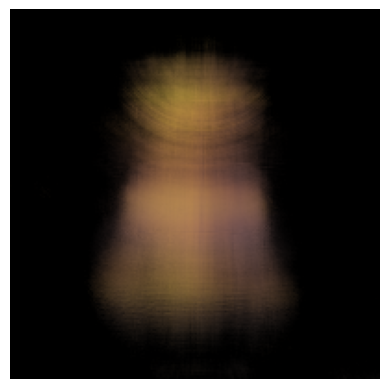

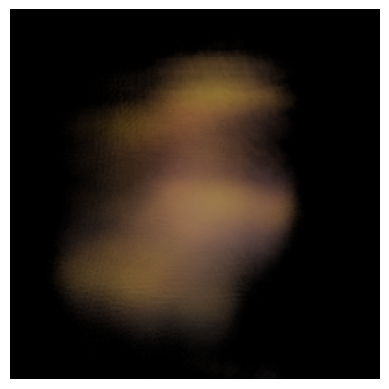

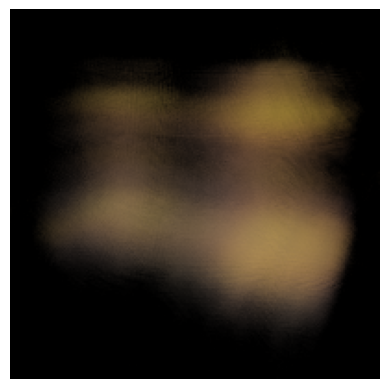

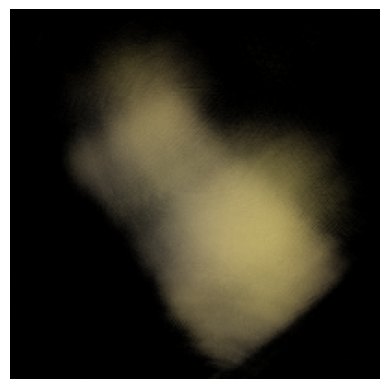

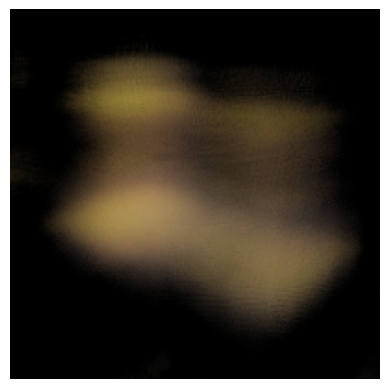

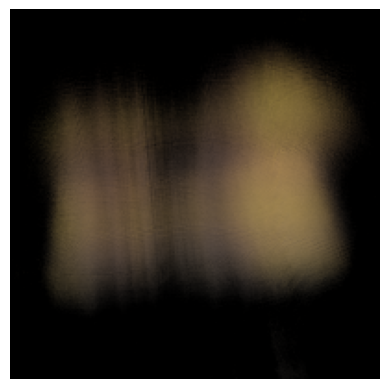

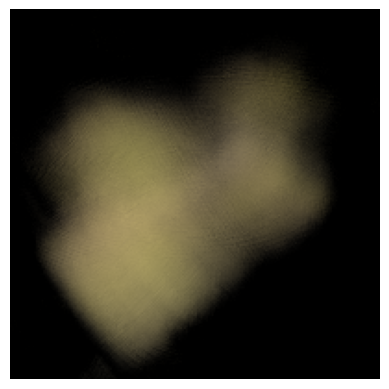

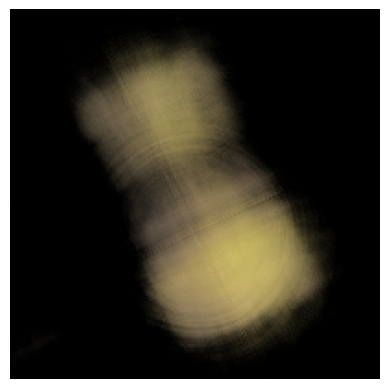

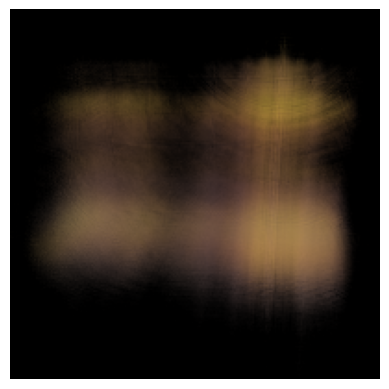

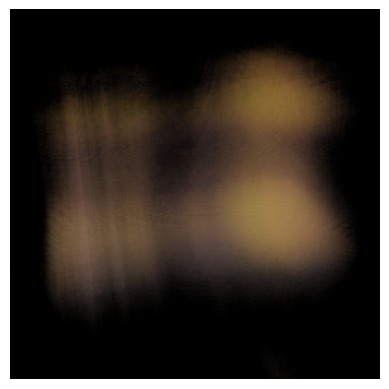

Iteration [100/1000], PSNR: 15.69
Iteration [100], Loss: 0.02679223008453846
Iteration [101], Loss: 0.025455988943576813
Iteration [102], Loss: 0.027509668841958046
Iteration [103], Loss: 0.02819131687283516
Iteration [104], Loss: 0.027254585176706314
Iteration [105], Loss: 0.025362718850374222
Iteration [106], Loss: 0.026673056185245514
Iteration [107], Loss: 0.02359902113676071
Iteration [108], Loss: 0.027802376076579094
Iteration [109], Loss: 0.021242666989564896
Iteration [110], Loss: 0.02657119557261467
Iteration [111], Loss: 0.02712973579764366
Iteration [112], Loss: 0.02403140626847744
Iteration [113], Loss: 0.022576116025447845
Iteration [114], Loss: 0.023375388234853745
Iteration [115], Loss: 0.022648021578788757
Iteration [116], Loss: 0.023646268993616104
Iteration [117], Loss: 0.019000204280018806
Iteration [118], Loss: 0.02218574658036232
Iteration [119], Loss: 0.020090779289603233
Iteration [120], Loss: 0.02237660251557827
Iteration [121], Loss: 0.024004695937037468
Iterat

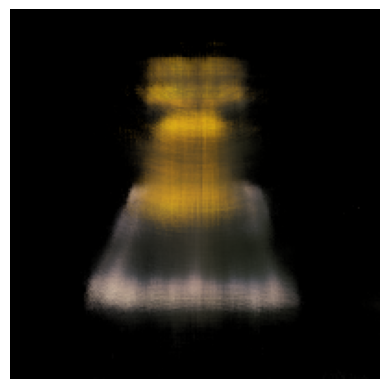

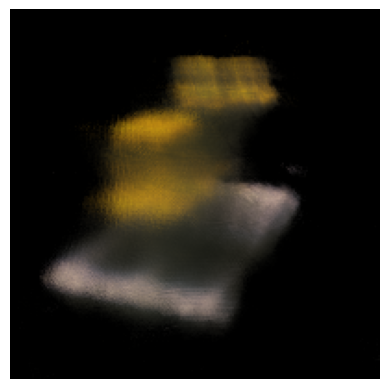

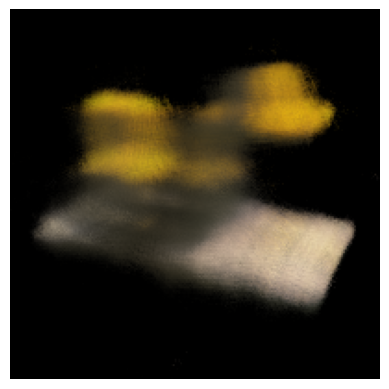

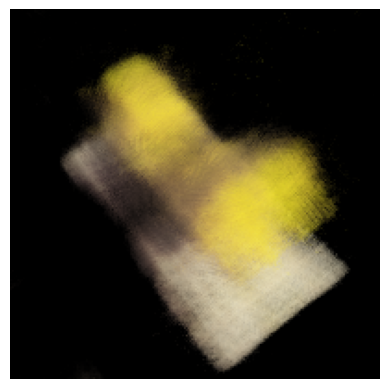

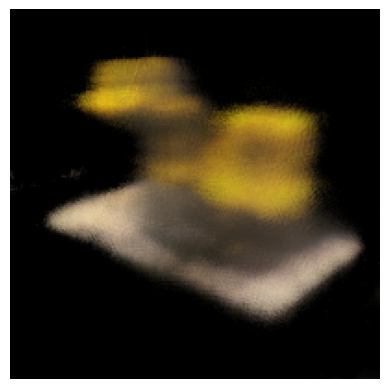

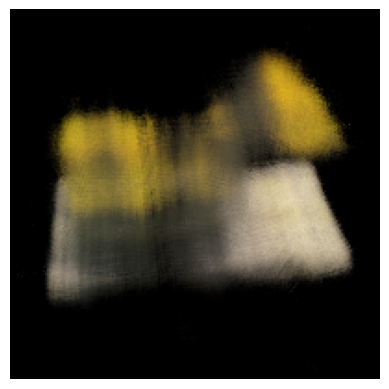

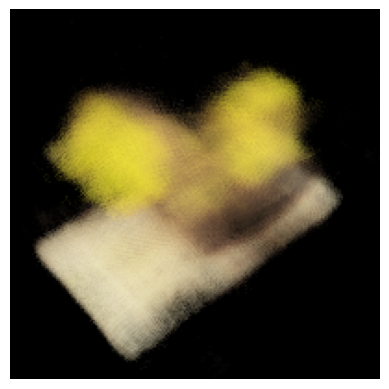

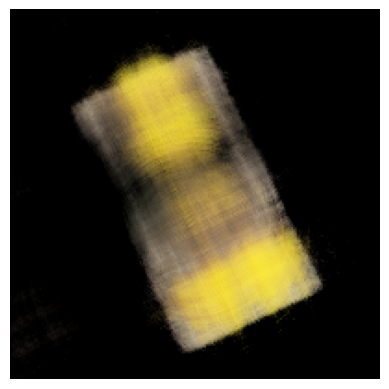

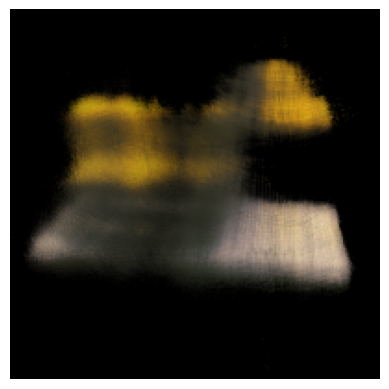

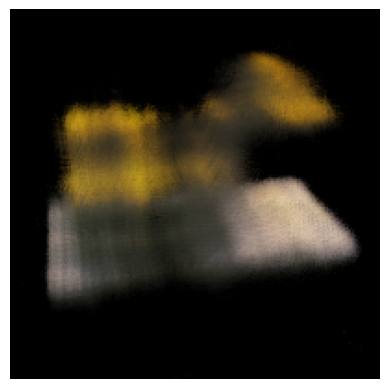

Iteration [200/1000], PSNR: 18.83
Iteration [200], Loss: 0.011361545883119106
Iteration [201], Loss: 0.012270857580006123
Iteration [202], Loss: 0.010735109448432922
Iteration [203], Loss: 0.013063513673841953
Iteration [204], Loss: 0.01377897523343563
Iteration [205], Loss: 0.012580694630742073
Iteration [206], Loss: 0.012446216307580471
Iteration [207], Loss: 0.013779093511402607
Iteration [208], Loss: 0.012571748346090317
Iteration [209], Loss: 0.012672839686274529
Iteration [210], Loss: 0.011287475936114788
Iteration [211], Loss: 0.012583112344145775
Iteration [212], Loss: 0.008754447102546692
Iteration [213], Loss: 0.010994344018399715
Iteration [214], Loss: 0.01078320574015379
Iteration [215], Loss: 0.012157699093222618
Iteration [216], Loss: 0.01150739286094904
Iteration [217], Loss: 0.01129935309290886
Iteration [218], Loss: 0.011365407146513462
Iteration [219], Loss: 0.011535330675542355
Iteration [220], Loss: 0.010159658268094063
Iteration [221], Loss: 0.00938709918409586
Ite

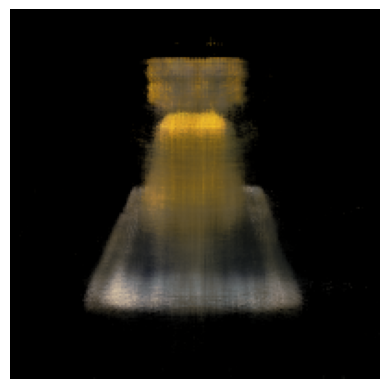

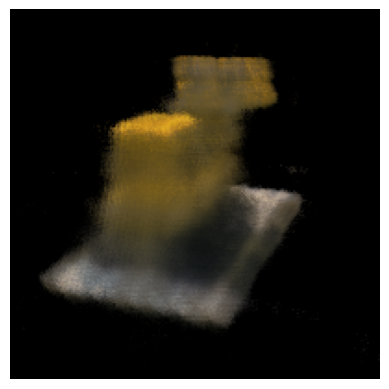

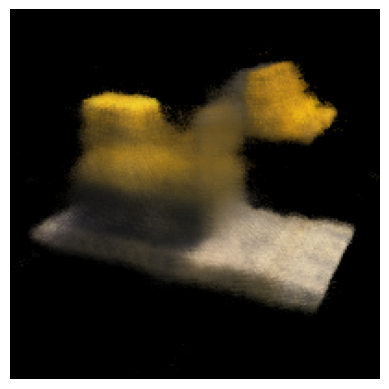

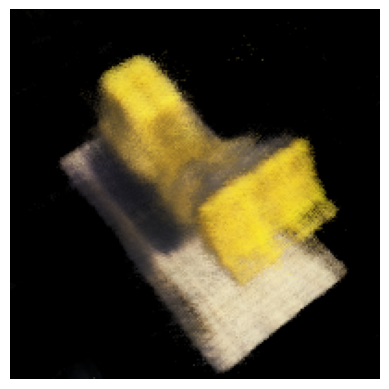

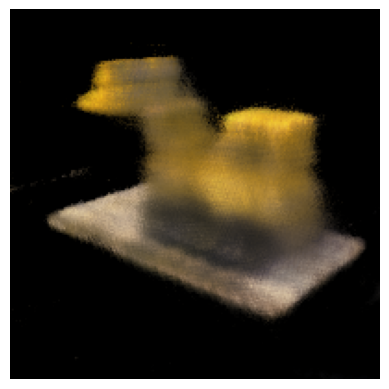

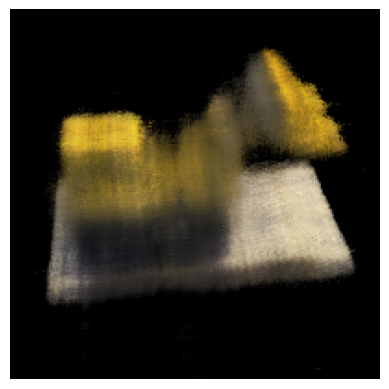

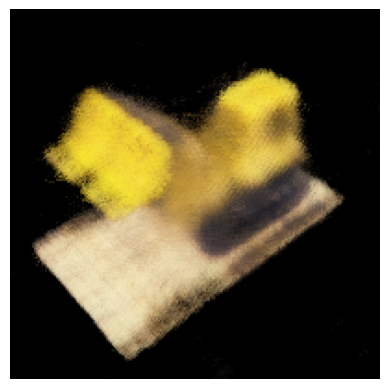

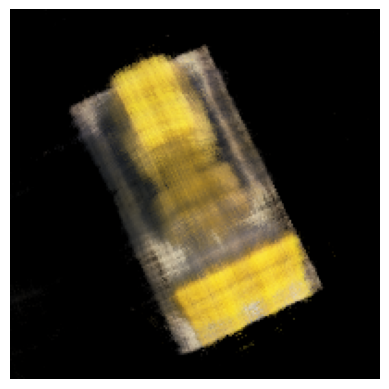

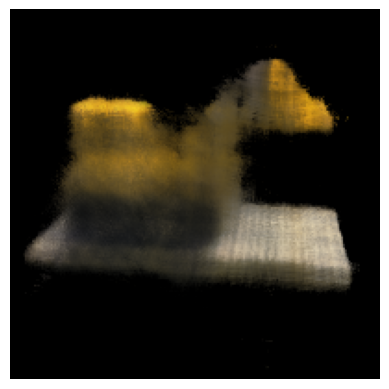

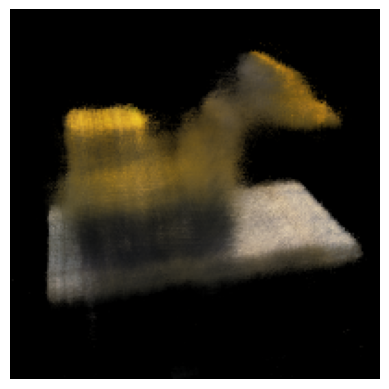

Iteration [300/1000], PSNR: 20.27
Iteration [300], Loss: 0.009405011311173439
Iteration [301], Loss: 0.008500882424414158
Iteration [302], Loss: 0.008345114067196846
Iteration [303], Loss: 0.008218004368245602
Iteration [304], Loss: 0.009962133131921291
Iteration [305], Loss: 0.010180809535086155
Iteration [306], Loss: 0.0088020795956254
Iteration [307], Loss: 0.007758749648928642
Iteration [308], Loss: 0.009621554054319859
Iteration [309], Loss: 0.009257692843675613
Iteration [310], Loss: 0.008931276388466358
Iteration [311], Loss: 0.008988413028419018
Iteration [312], Loss: 0.009414528496563435
Iteration [313], Loss: 0.009098853915929794
Iteration [314], Loss: 0.007127478253096342
Iteration [315], Loss: 0.008186579681932926
Iteration [316], Loss: 0.008018100634217262
Iteration [317], Loss: 0.007795711513608694
Iteration [318], Loss: 0.008402944542467594
Iteration [319], Loss: 0.008496109396219254
Iteration [320], Loss: 0.008311411365866661
Iteration [321], Loss: 0.008167753927409649


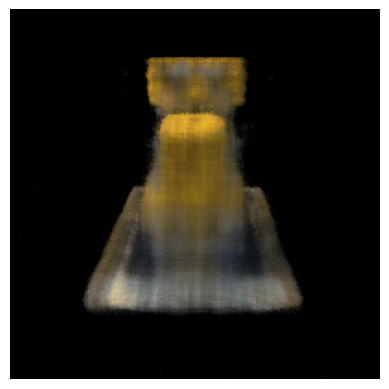

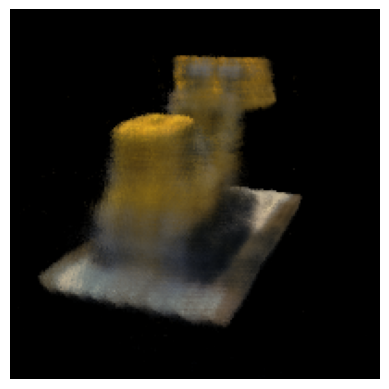

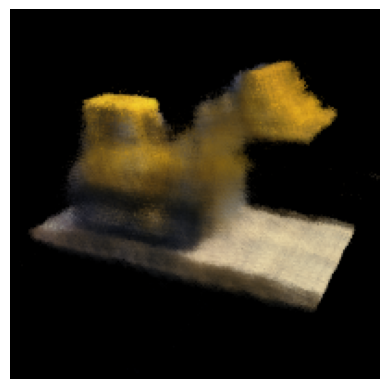

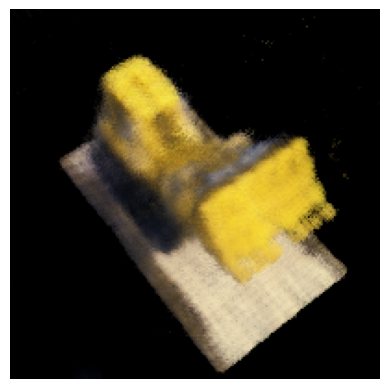

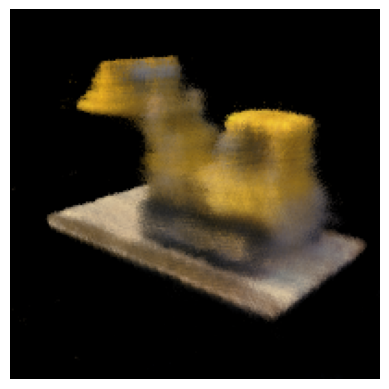

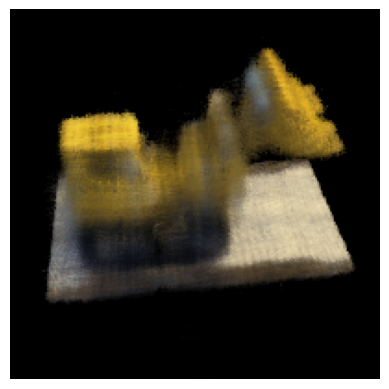

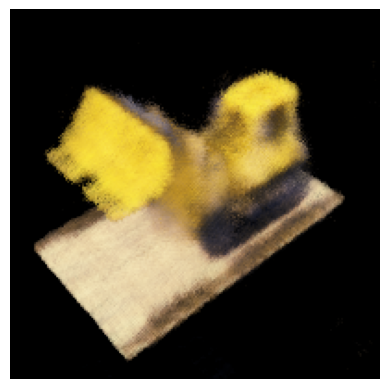

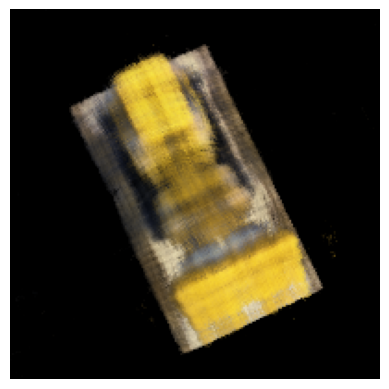

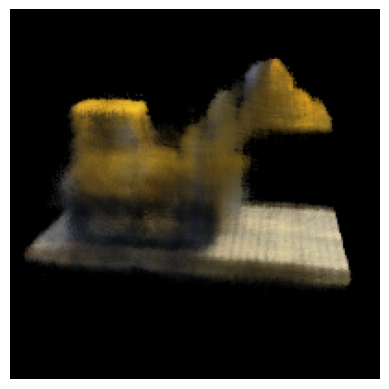

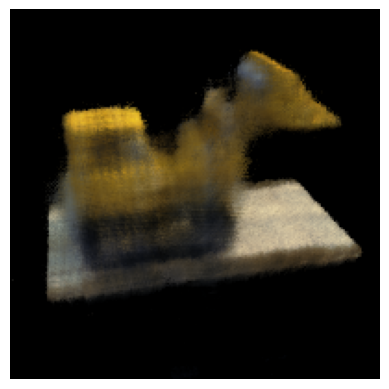

Iteration [400/1000], PSNR: 21.31
Iteration [400], Loss: 0.007156272418797016
Iteration [401], Loss: 0.0072163925506174564
Iteration [402], Loss: 0.007237105164676905
Iteration [403], Loss: 0.008328049443662167
Iteration [404], Loss: 0.007870550267398357
Iteration [405], Loss: 0.006564633455127478
Iteration [406], Loss: 0.007747959811240435
Iteration [407], Loss: 0.006930878851562738
Iteration [408], Loss: 0.0068216645158827305
Iteration [409], Loss: 0.007218070328235626
Iteration [410], Loss: 0.0068625216372311115
Iteration [411], Loss: 0.007102316245436668
Iteration [412], Loss: 0.007039329037070274
Iteration [413], Loss: 0.008214710280299187
Iteration [414], Loss: 0.007590638007968664
Iteration [415], Loss: 0.007012130226939917
Iteration [416], Loss: 0.0073506757616996765
Iteration [417], Loss: 0.006759352050721645
Iteration [418], Loss: 0.007797126658260822
Iteration [419], Loss: 0.00815341342240572
Iteration [420], Loss: 0.006958813406527042
Iteration [421], Loss: 0.00795830879360

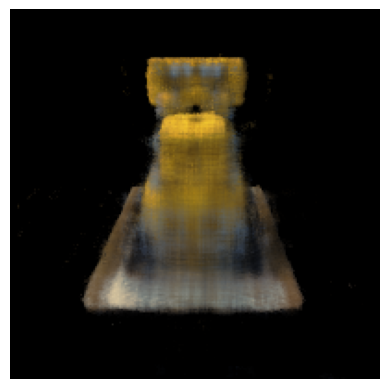

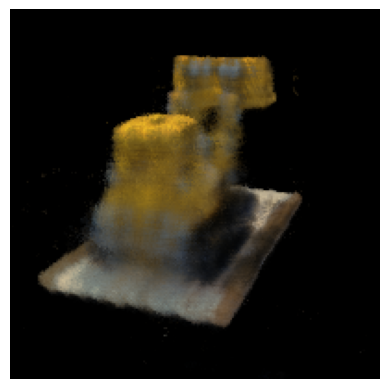

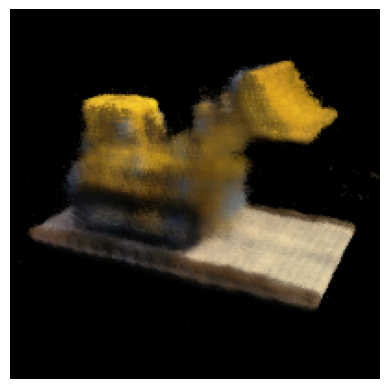

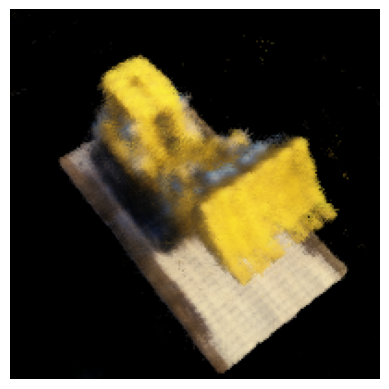

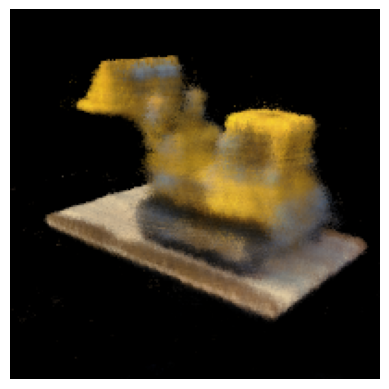

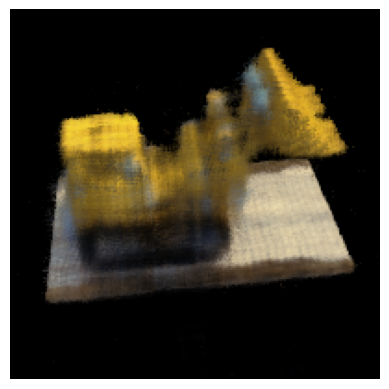

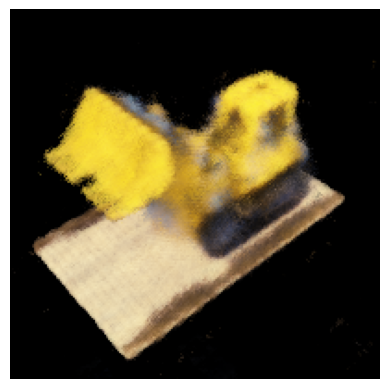

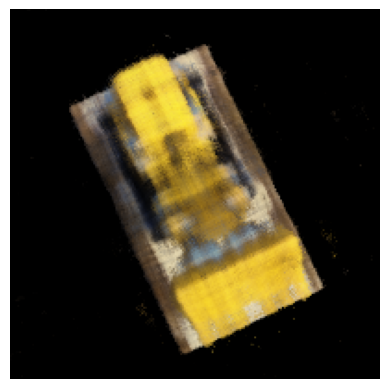

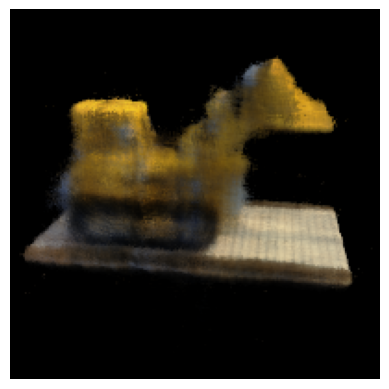

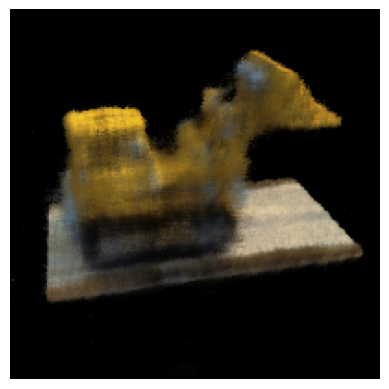

Iteration [500/1000], PSNR: 21.25
Iteration [500], Loss: 0.007427065633237362
Iteration [501], Loss: 0.006709375884383917
Iteration [502], Loss: 0.005939858965575695
Iteration [503], Loss: 0.006004151422530413
Iteration [504], Loss: 0.008222613483667374
Iteration [505], Loss: 0.006303818896412849
Iteration [506], Loss: 0.00743384612724185
Iteration [507], Loss: 0.008144348859786987
Iteration [508], Loss: 0.0064187683165073395
Iteration [509], Loss: 0.006750008091330528
Iteration [510], Loss: 0.006075600162148476
Iteration [511], Loss: 0.006474676541984081
Iteration [512], Loss: 0.005810974165797234
Iteration [513], Loss: 0.005929525475949049
Iteration [514], Loss: 0.0062499879859387875
Iteration [515], Loss: 0.006174849346280098
Iteration [516], Loss: 0.006014264654368162
Iteration [517], Loss: 0.005880516953766346
Iteration [518], Loss: 0.006496846210211515
Iteration [519], Loss: 0.007188947405666113
Iteration [520], Loss: 0.006346504203975201
Iteration [521], Loss: 0.0056379148736596

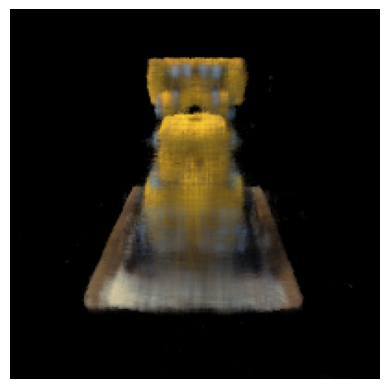

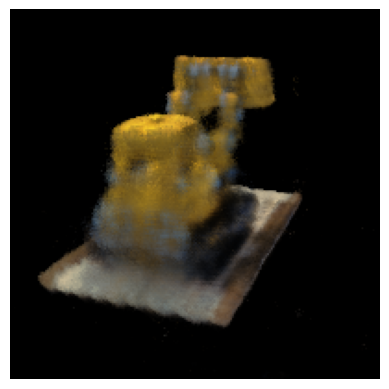

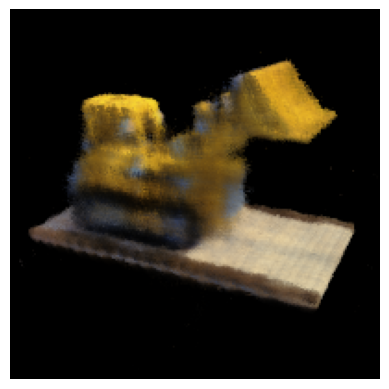

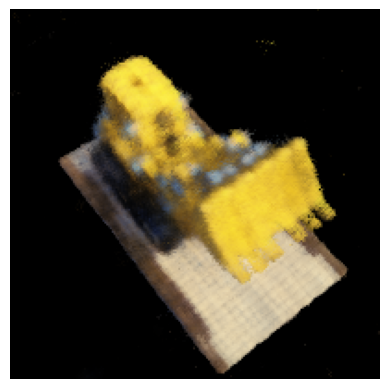

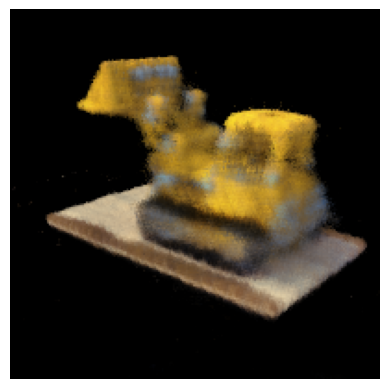

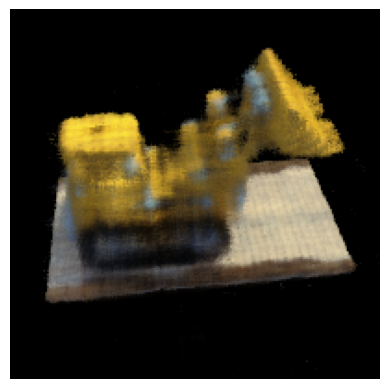

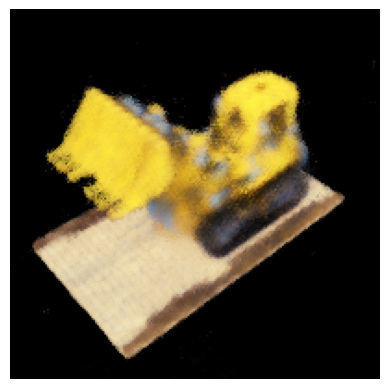

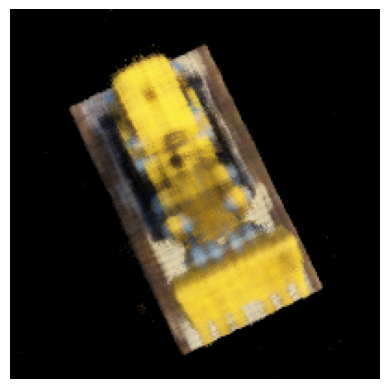

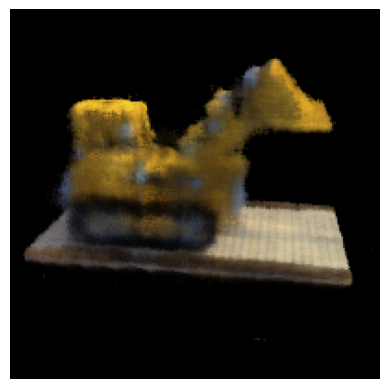

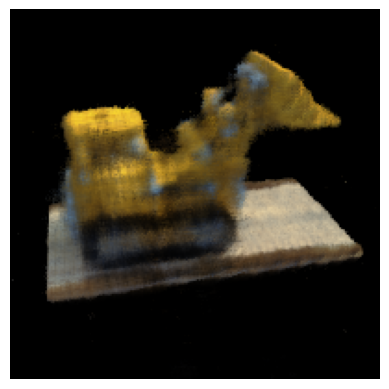

Iteration [600/1000], PSNR: 21.78
Iteration [600], Loss: 0.005486719775944948
Iteration [601], Loss: 0.005202572792768478
Iteration [602], Loss: 0.0058418987318873405
Iteration [603], Loss: 0.00490077119320631
Iteration [604], Loss: 0.006462863180786371
Iteration [605], Loss: 0.006059734150767326
Iteration [606], Loss: 0.00579787278547883
Iteration [607], Loss: 0.0055338856764137745
Iteration [608], Loss: 0.005753087345510721
Iteration [609], Loss: 0.006398994009941816
Iteration [610], Loss: 0.005652241874486208
Iteration [611], Loss: 0.005942780524492264
Iteration [612], Loss: 0.006751808803528547
Iteration [613], Loss: 0.005622771102935076
Iteration [614], Loss: 0.005089238751679659
Iteration [615], Loss: 0.004784067627042532
Iteration [616], Loss: 0.005868673324584961
Iteration [617], Loss: 0.00526830367743969
Iteration [618], Loss: 0.00557550135999918
Iteration [619], Loss: 0.006225478369742632
Iteration [620], Loss: 0.006294651422649622
Iteration [621], Loss: 0.005444773938506842


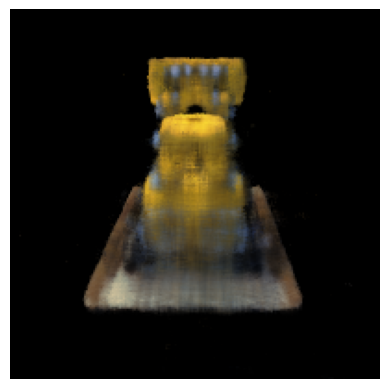

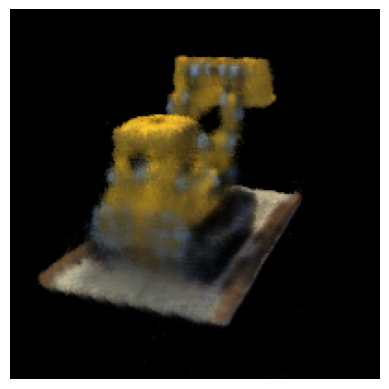

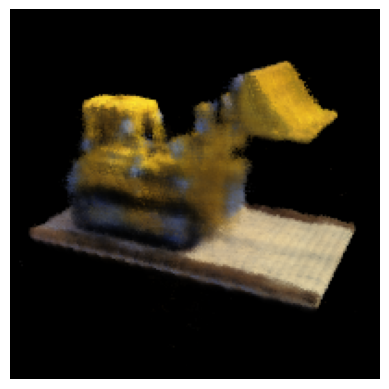

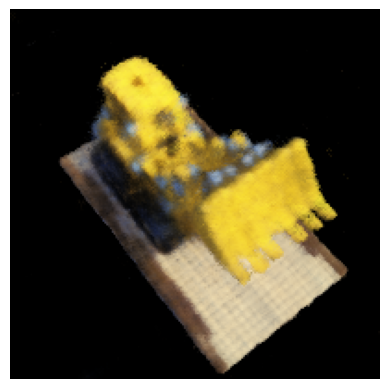

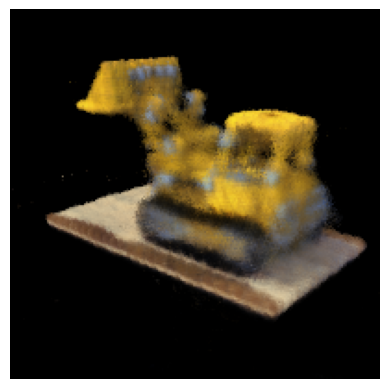

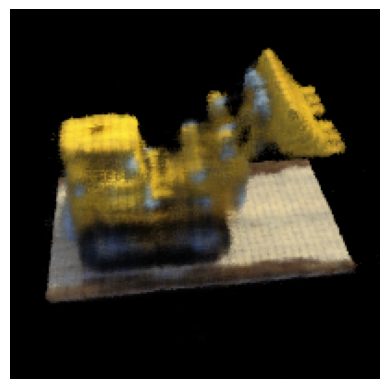

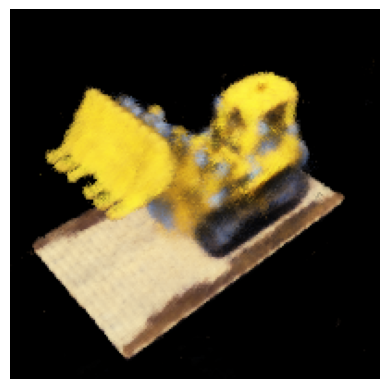

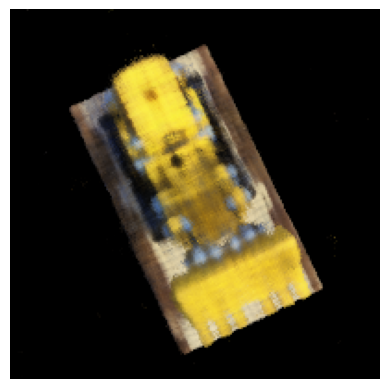

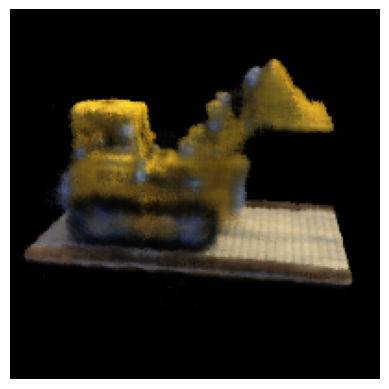

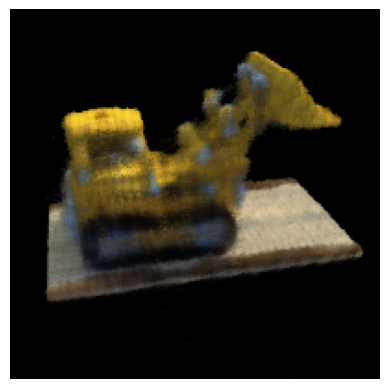

Iteration [700/1000], PSNR: 23.11
Iteration [700], Loss: 0.00521096820011735
Iteration [701], Loss: 0.005369126796722412
Iteration [702], Loss: 0.004732717759907246
Iteration [703], Loss: 0.0051176478154957294
Iteration [704], Loss: 0.004968754947185516
Iteration [705], Loss: 0.004676526878029108
Iteration [706], Loss: 0.005835800431668758
Iteration [707], Loss: 0.00541464239358902
Iteration [708], Loss: 0.0058718109503388405
Iteration [709], Loss: 0.005217942409217358
Iteration [710], Loss: 0.005511956289410591
Iteration [711], Loss: 0.005261552054435015
Iteration [712], Loss: 0.004818498622626066
Iteration [713], Loss: 0.004777112044394016
Iteration [714], Loss: 0.005446170922368765
Iteration [715], Loss: 0.004887288436293602
Iteration [716], Loss: 0.005408621858805418
Iteration [717], Loss: 0.0054754591546952724
Iteration [718], Loss: 0.004898160696029663
Iteration [719], Loss: 0.0051799071952700615
Iteration [720], Loss: 0.004690717905759811
Iteration [721], Loss: 0.006356669589877

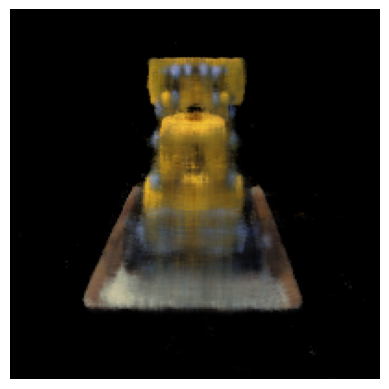

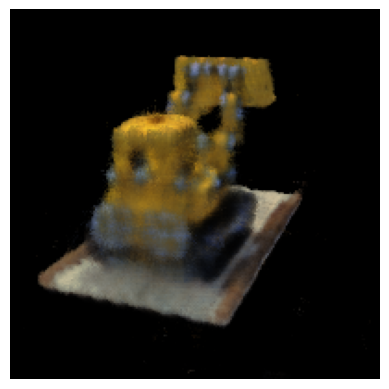

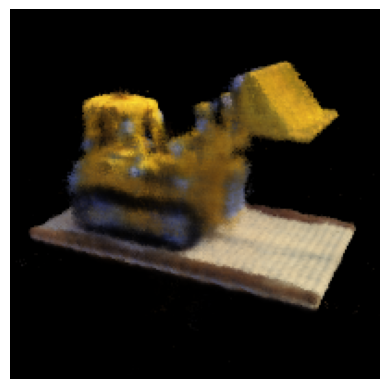

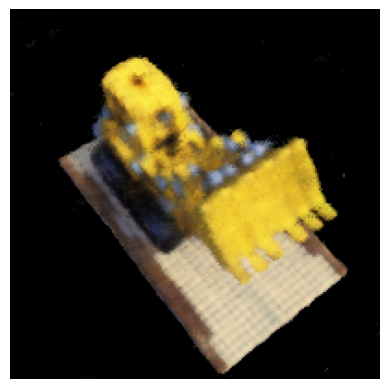

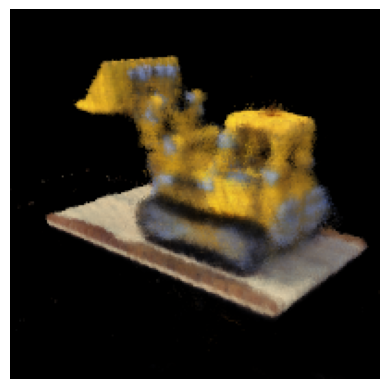

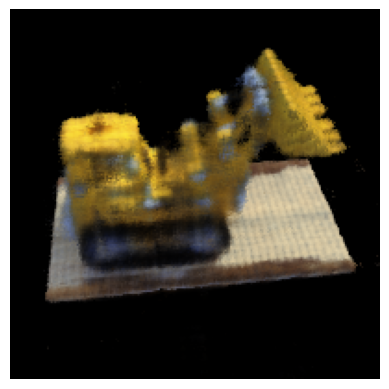

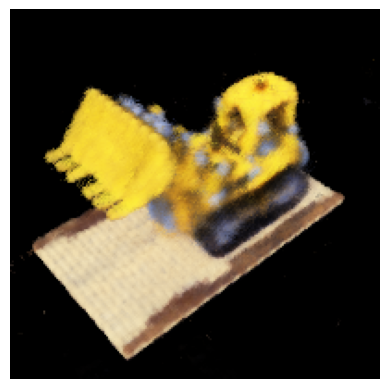

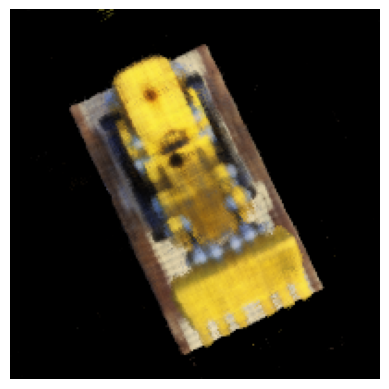

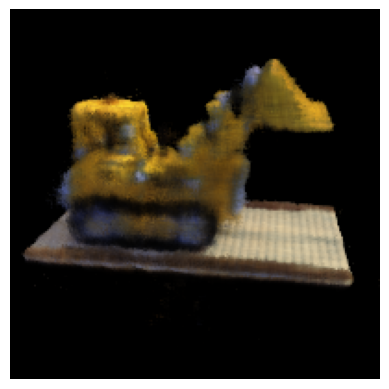

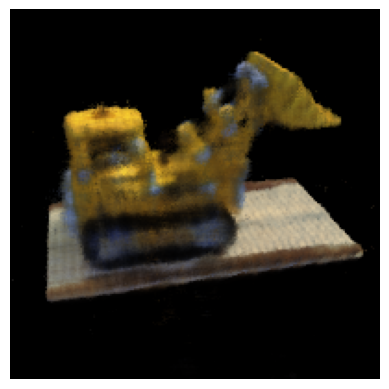

Iteration [800/1000], PSNR: 23.19
Iteration [800], Loss: 0.0053603993728756905
Iteration [801], Loss: 0.004734320566058159
Iteration [802], Loss: 0.00477144680917263
Iteration [803], Loss: 0.005157061852514744
Iteration [804], Loss: 0.005399526096880436
Iteration [805], Loss: 0.004874750971794128
Iteration [806], Loss: 0.005786864086985588
Iteration [807], Loss: 0.0054138726554811
Iteration [808], Loss: 0.0042505222372710705
Iteration [809], Loss: 0.004945358261466026
Iteration [810], Loss: 0.005092720501124859
Iteration [811], Loss: 0.005282529629766941
Iteration [812], Loss: 0.004420545417815447
Iteration [813], Loss: 0.004886397160589695
Iteration [814], Loss: 0.00465577095746994
Iteration [815], Loss: 0.0047951084561645985
Iteration [816], Loss: 0.005110650788992643
Iteration [817], Loss: 0.004763300530612469
Iteration [818], Loss: 0.004536404274404049
Iteration [819], Loss: 0.004594557918608189
Iteration [820], Loss: 0.003977139946073294
Iteration [821], Loss: 0.005080117844045162

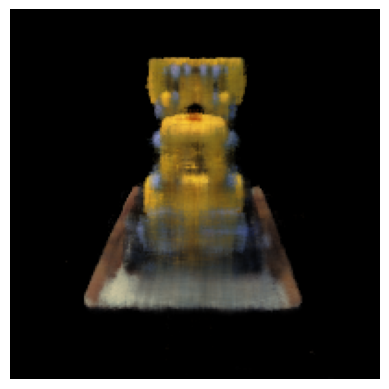

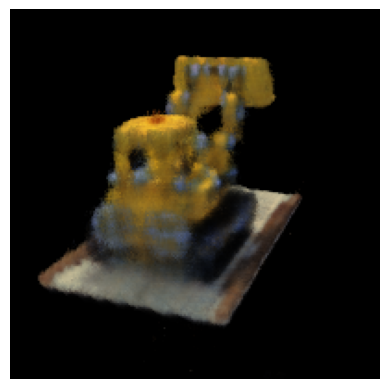

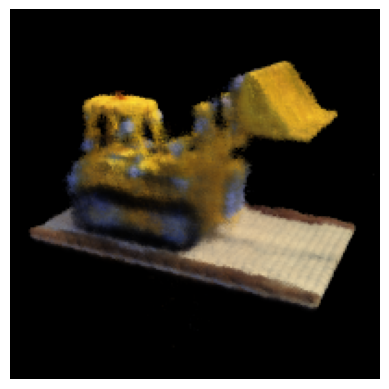

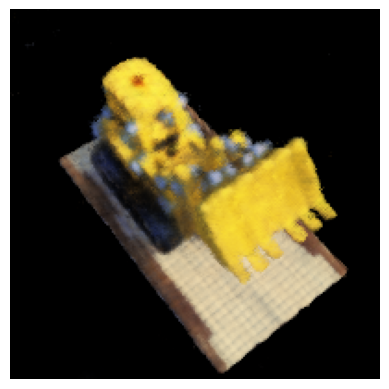

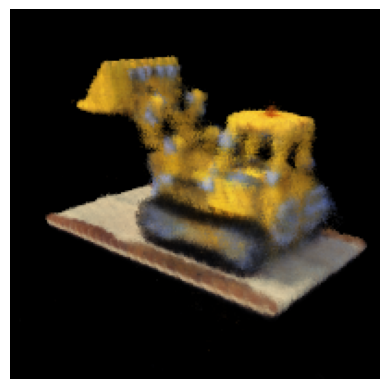

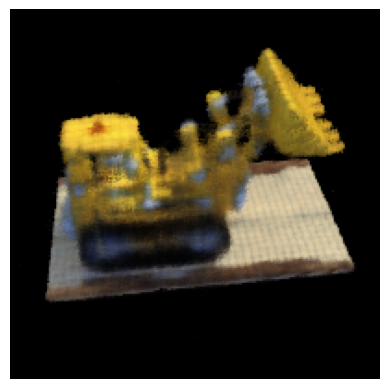

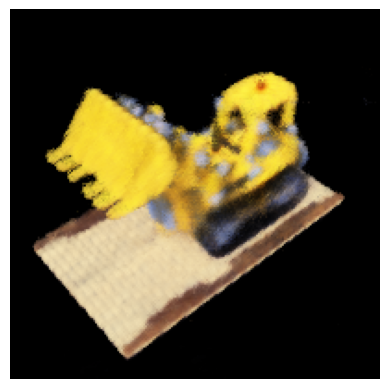

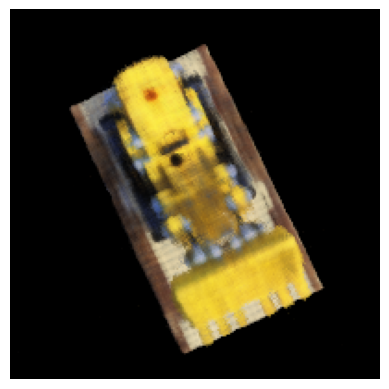

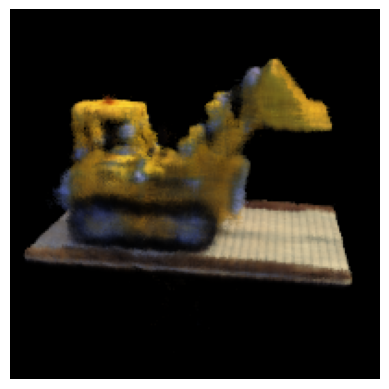

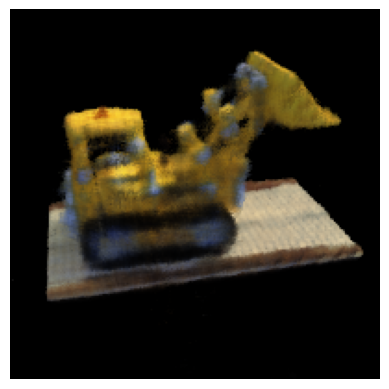

Iteration [900/1000], PSNR: 23.02
Iteration [900], Loss: 0.005276107229292393
Iteration [901], Loss: 0.0046152821741998196
Iteration [902], Loss: 0.004533480852842331
Iteration [903], Loss: 0.004653603304177523
Iteration [904], Loss: 0.00444409903138876
Iteration [905], Loss: 0.0045696524903178215
Iteration [906], Loss: 0.00505334185436368
Iteration [907], Loss: 0.004694231320172548
Iteration [908], Loss: 0.004522665403783321
Iteration [909], Loss: 0.0052421619184315205
Iteration [910], Loss: 0.004132116213440895
Iteration [911], Loss: 0.0038884191308170557
Iteration [912], Loss: 0.004797295201569796
Iteration [913], Loss: 0.004102522507309914
Iteration [914], Loss: 0.004427576437592506
Iteration [915], Loss: 0.0056189801543951035
Iteration [916], Loss: 0.004576764535158873
Iteration [917], Loss: 0.004717396106570959
Iteration [918], Loss: 0.005356472916901112
Iteration [919], Loss: 0.004730274435132742
Iteration [920], Loss: 0.004440269898623228
Iteration [921], Loss: 0.00395556166768

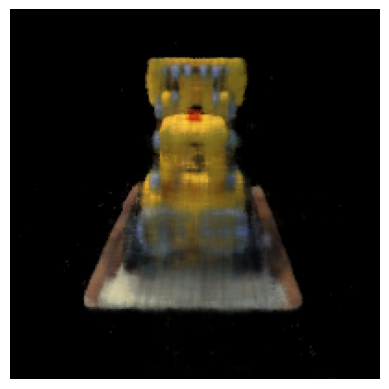

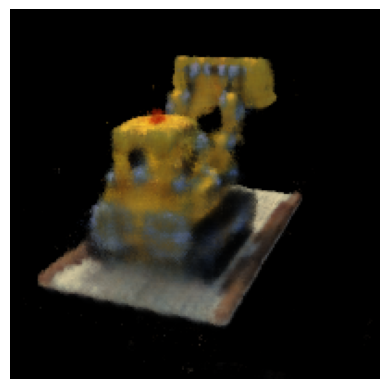

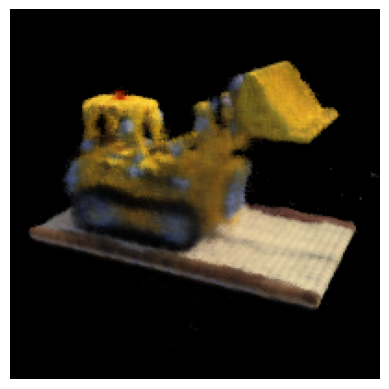

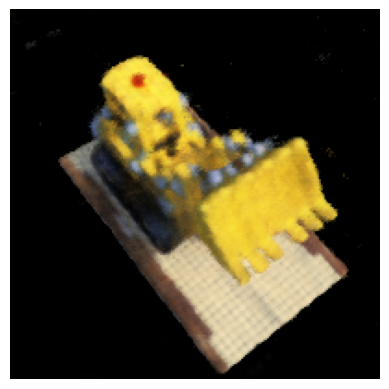

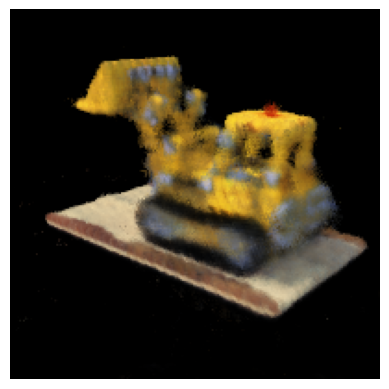

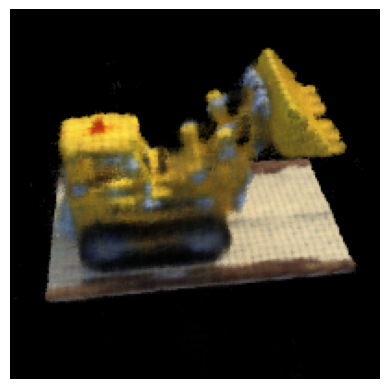

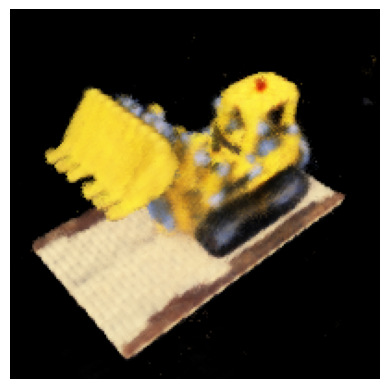

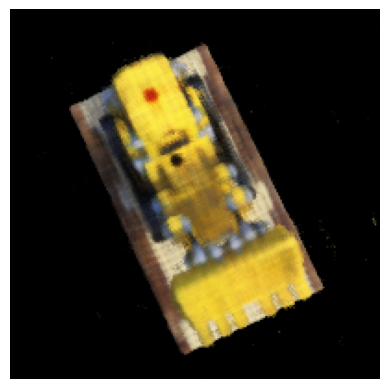

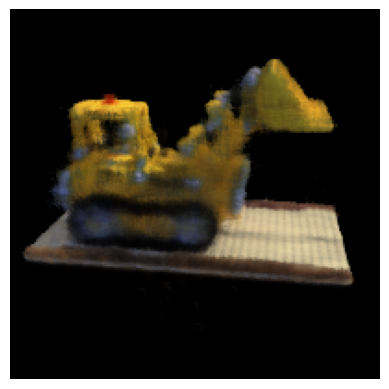

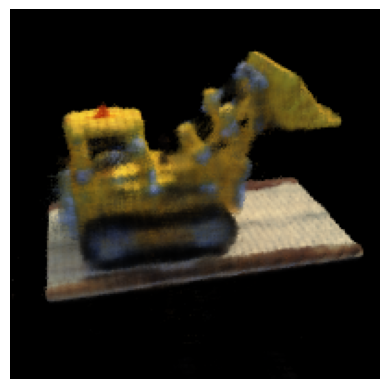

Iteration [1000/1000], PSNR: 23.62


In [ ]:
K = np.array([[focal, 0, 100],
              [0, focal, 100],
              [0, 0, 1]])
dataset = RaysData(images_train, K, c2ws_train)
num_epochs = 1000

model = RadianceFieldNetwork().cuda()
criterion = nn.MSELoss()
lr = 5e-4
optimizer = optim.Adam(model.parameters(), lr=lr)



psnr = 0.0
for epoch in range(num_epochs):
  # sampled 10k rays
  rays_o, rays_d, pixels = dataset.sample_rays(10000)
  pixels = torch.from_numpy(pixels.reshape((pixels.shape[0]*pixels.shape[1],pixels.shape[2])).astype(np.float32)).cuda()

  # and get their points
  points = sample_along_rays(rays_o, rays_d, perturb=True)
  # points -> 100, 64, 3
  points = np.einsum('ijk->ijk', points)

  rays_o, rays_d, points = torch.from_numpy(rays_o.T.astype(np.float32)).cuda(), torch.from_numpy(rays_d.T.astype(np.float32)).cuda(), torch.from_numpy(points.astype(np.float32)).cuda()

  # for each ray_o and ray_d, get its density and rgb
  rays_d = rays_d.unsqueeze(1).repeat_interleave(64, dim=1)
  density, rgb = model(points, rays_d)
  # use density and rgb generates color
  # rendered_colors should be N x 3
  rendered_colors = volrend(density, rgb)

  loss = criterion(rendered_colors, pixels)
  optimizer.zero_grad()
  loss.backward()
  optimizer.step()

# Calculate PSNR
  mse = loss.item()
  psnr = 10 * math.log10(1 / mse)  # Assuming the image and targets are in the range [0, 1]

  wandb.log({"psnr": psnr, "loss": loss, "epoch":epoch})
  print(f'Iteration [{epoch}], Loss: {mse}')
  # Print the PSNR for every 100 iterations
  if (epoch + 1) % 100 == 0:
    eval_model(epoch)
    model.train()
    model.cuda()
    print(f'Iteration [{epoch + 1}/{num_epochs}], PSNR: {psnr:.2f}')






In [ ]:
# extra training stuff

num_epochs = 20000
model.cuda()
model.train()
for epoch in range(num_epochs):
  # sampled 10k rays
  rays_o, rays_d, pixels = dataset.sample_rays(10000)
  pixels = torch.from_numpy(pixels.reshape((pixels.shape[0]*pixels.shape[1],pixels.shape[2])).astype(np.float32)).cuda()

  # and get their points
  points = sample_along_rays(rays_o, rays_d, perturb=True)
  # points -> 100, 64, 3
  points = np.einsum('ijk->ijk', points)

  rays_o, rays_d, points = torch.from_numpy(rays_o.T.astype(np.float32)).cuda(), torch.from_numpy(rays_d.T.astype(np.float32)).cuda(), torch.from_numpy(points.astype(np.float32)).cuda()
  # points = torch.from_numpy(points)

  # for each ray_o and ray_d, get its density and rgb
  rays_d = rays_d.unsqueeze(1).repeat_interleave(64, dim=1)
  density, rgb = model(points, rays_d)
  # use density and rgb generates color
  # rendered_colors should be N x 3
  rendered_colors = volrend(density, rgb)
  loss = criterion(rendered_colors, pixels)
  optimizer.zero_grad()
  loss.backward()
  optimizer.step()

# Calculate PSNR
  mse = loss.item()
  psnr = 10 * math.log10(1 / mse)  # Assuming the image and targets are in the range [0, 1]
  # wandb.log({"psnr": psnr, "loss": loss})
  print(f'Iteration [{epoch}], Loss: {mse}')
  # Print the PSNR for every 100 iterations
  if (epoch + 1) % 100 == 0:
      print(f'Iteration [{epoch + 1}/{num_epochs}], PSNR: {psnr:.2f}')
  if (epoch + 1) % 3000 == 0:
    checkpoint = {
    'epoch': epoch,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'loss': loss,
    'psnr':psnr
    }
    torch.save(checkpoint, 'nerf_checkpoint.pth')
    torch.save(checkpoint, '/content/drive/My Drive/project5/nerf1_checkpoint.pth')






Streaming output truncated to the last 5000 lines.
Iteration [7048], Loss: 0.0012717894278466702
Iteration [7049], Loss: 0.0016197998775169253
Iteration [7050], Loss: 0.0015873622614890337
Iteration [7051], Loss: 0.0015090042725205421
Iteration [7052], Loss: 0.0014958997489884496
Iteration [7053], Loss: 0.0012270609149709344
Iteration [7054], Loss: 0.0012603428913280368
Iteration [7055], Loss: 0.001269038999453187
Iteration [7056], Loss: 0.0011183589231222868
Iteration [7057], Loss: 0.001728225965052843
Iteration [7058], Loss: 0.0014942251145839691
Iteration [7059], Loss: 0.0014538519317284226
Iteration [7060], Loss: 0.0013507367111742496
Iteration [7061], Loss: 0.0015632531139999628
Iteration [7062], Loss: 0.0015000246930867434
Iteration [7063], Loss: 0.0018835728988051414
Iteration [7064], Loss: 0.0016439983155578375
Iteration [7065], Loss: 0.00134197564329952
Iteration [7066], Loss: 0.0017433533212170005
Iteration [7067], Loss: 0.0013894427102059126
Iteration [7068], Loss: 0.0016230

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Iteration [11999], Loss: 0.0015069593209773302
Iteration [12000/20000], PSNR: 28.22
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-40-ed5c0ed511f1>", line 45, in <cell line: 4>
    torch.save(checkpoint, 'nerf_checkpoint.pth')
  File "/usr/local/lib/python3.10/dist-packages/torch/serialization.py", line 618, in save
    with _open_zipfile_writer(f) as opened_zipfile:
  File "/usr/local/lib/python3.10/dist-packages/torch/serialization.py", line 492, in _open_zipfile_writer
    return container(name_or_buffer)
  File "/usr/local/lib/python3.10/dist-packages/torch/serialization.py", line 463, in __init__
    super().__init__(torch._C.PyTorchFileWriter(self.name))
RuntimeError: File nerf_checkpoint.pth cannot be opened.

During handling of the above exception, another exception occurred:

Traceback (most recent call last)

In [ ]:
checkpoint = {
    'epoch': epoch,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'loss': loss,
    'psnr':psnr
}

torch.save(checkpoint, 'nerf_checkpoint.pth')
torch.save(checkpoint, '/content/drive/My Drive/project5/nerf1_checkpoint.pth')

0


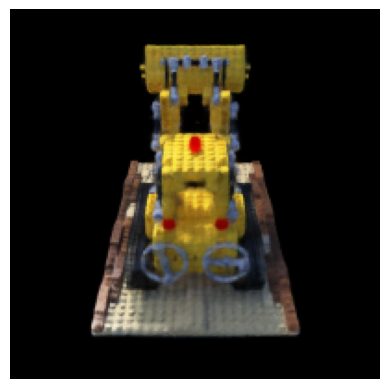

1


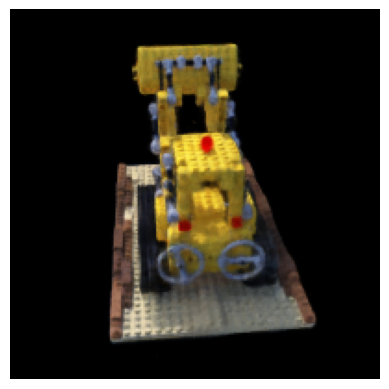

2


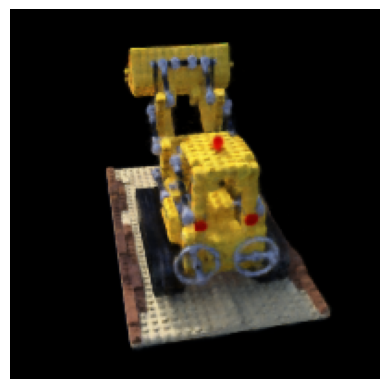

3


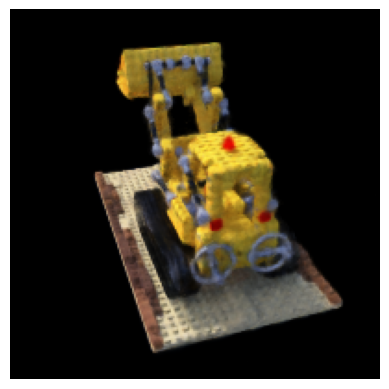

4


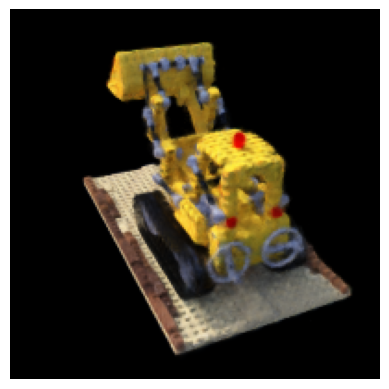

5


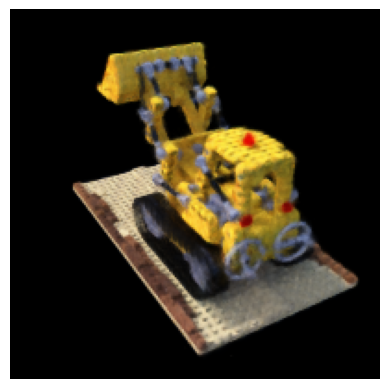

6


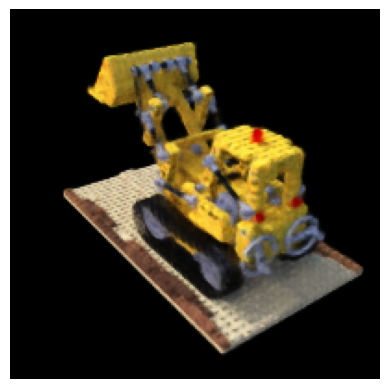

7


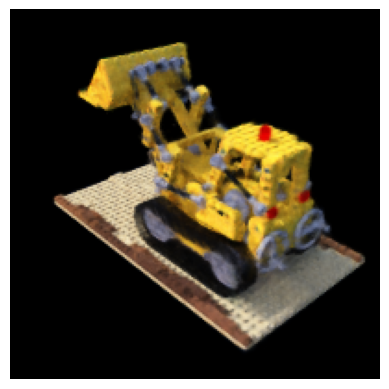

8


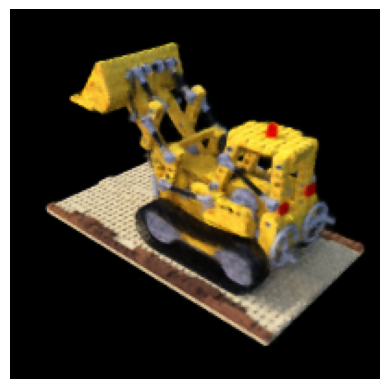

9


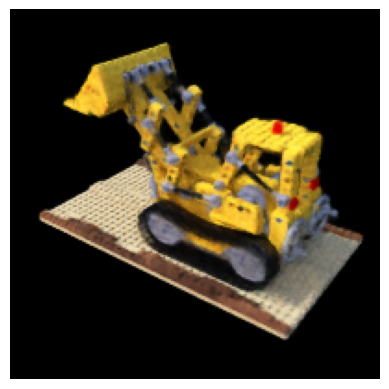

10


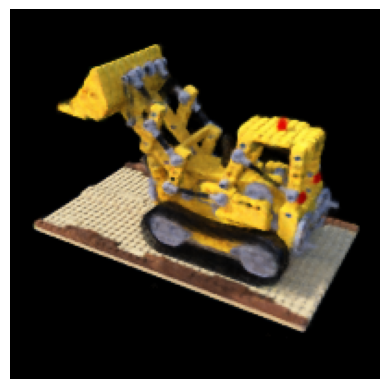

11


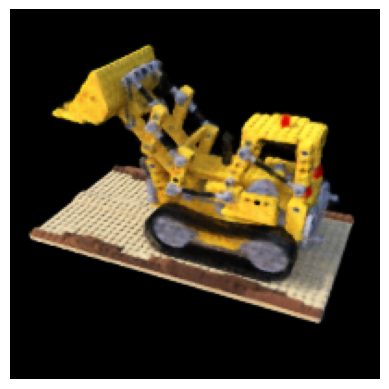

12


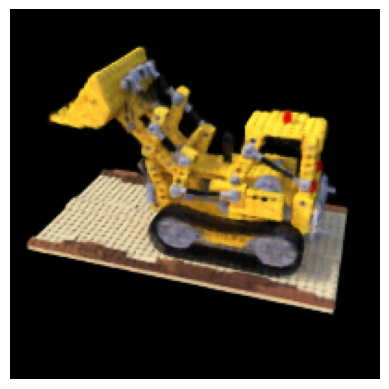

13


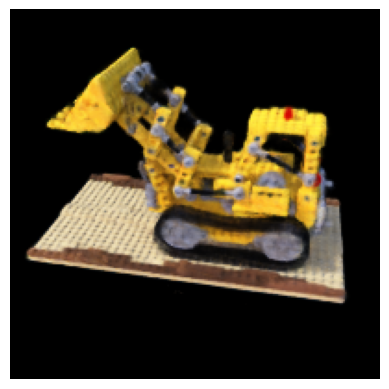

14


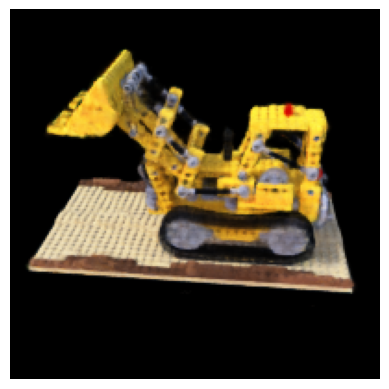

15


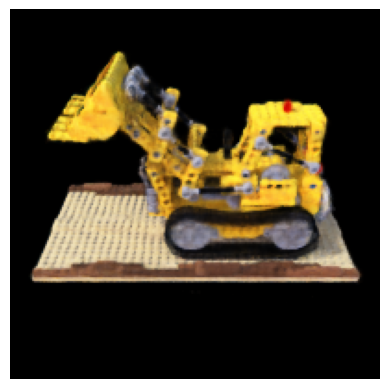

In [ ]:
all_frames = []
model = RadianceFieldNetwork()
dataset = RaysData(images_val, K, c2ws_test)



checkpoint = torch.load('/content/drive/My Drive/project5/nerf1_checkpoint.pth')
model.load_state_dict(checkpoint['model_state_dict'])

model.eval()  # Set the model to evaluation mode
model.cpu()


# Pass coordinates through the model to generate pixel colors
with torch.no_grad():

  rays_per_image = 40000

  x = np.arange(200)
  y = np.arange(200)


  x_coords, y_coords = np.meshgrid(x, y)

  # Stack the coordinates to create a 2D array
  coordinates = np.vstack((x_coords.flatten(), y_coords.flatten())).T

  v = coordinates[:, 0] + 0.5
  u = coordinates[:, 1] + 0.5
  uv = np.stack((u, v))

  for i in range(c2ws_test.shape[0]):
    # for index in selected_indicies:
    # image = dataset.images[i]
    result_image = np.zeros((200,200,3))
    c2w =c2ws_test[i]

    ray_o, ray_d = pixel_to_ray(K, c2w, uv)
    ray_o, ray_d = ray_o.T, ray_d.T
    # colors = np.array([image[int(y), int(x)] for x, y in coordinates])
    points = sample_along_rays(ray_o, ray_d, perturb=False)
    points = np.einsum('ikj->jki', points)
    ray_d = np.repeat(ray_d[:, np.newaxis, :], 64, axis=1)
    ray_d,points = torch.tensor(ray_d, dtype=torch.float32), torch.tensor(points, dtype=torch.float32)
    density, rgb = model(points, ray_d)
    rendered_colors = volrend(density, rgb)

    # Convert predicted colors to a NumPy array
    rendered_colors = rendered_colors.numpy()

    for idx, (u,v) in enumerate(coordinates):
      result_image[u,v,:] = rendered_colors[idx]


    all_frames.append(result_image)
    print(i)
    plt.imshow(result_image)
    plt.axis('off')
    plt.show()



In [ ]:
from PIL import Image
# Assuming all_frames is a list of numpy.ndarray objects
pil_frames = [Image.fromarray((frame * 255).astype(np.uint8)) for frame in all_frames]

# Save as GIF
pil_frames[0].save('lego.gif', save_all=True, append_images=pil_frames[1:], duration=1000 // 60, loop=0)
